# Predictive Modelling

- **[Setting Dependent Variables for Training](#Variables)**
<br>

- **Unsupervised Learning**:
    - **[Multiple Correspondence Analysis](#MCA)**:
    Multiple correspondence analysis is a multivariate statistical technique that summarizes and visualizes the relationships between multiple categorical variables. It works by constructing a set of dimensions that capture the underlying structure of the data and plots the variables and categories in these dimensions to reveal patterns and associations.
<br>
    
    
- **Supervised Learning**:
    - **[Ordinal Logistic Regression](#OrdinalLogisticRegression)**:
    This is a popular statistical method used for binary classification problems. You can use logistic regression to predict the target variable based on the categorical attributes.  
    <br>

    - **[Decision Trees](#DecisionTrees)**:
    Decision trees are a popular algorithm for classification problems, especially when the data has categorical attributes. Decision trees can be used to split the data based on the categories of the attributes, and make a prediction based on the majority class at each leaf node.
    <br>

    - **[Random Forests](#RandomForests)**: 
    Random forests are an ensemble method that combines multiple decision trees to improve the accuracy of the predictions. Random forests are especially useful for high-dimensional datasets with a large number of categorical attributes.  
    <br>

    - **[Naive Bayes](#NaiveBayers)**: 
    Naive Bayes is a simple probabilistic algorithm used for classification tasks. It assumes that the attributes are conditionally independent given the target variable, and uses Bayes' theorem to calculate the probability of each class given the attributes.
    <br>

    - **[K-Nearest Neighbor (K-NN)](#KNN)**: 
    K-NN is a non-parametric algorithm that can be used for classification tasks. It works by finding the K nearest neighbors of a new data point based on the categorical attributes, and assigning a class label based on the majority class of the neighbors.
 
---

## Import libraries and raw data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import seaborn as sns

from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.neighbors import NearestNeighbors, KNeighborsClassifier
from sklearn.metrics import silhouette_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from statsmodels.miscmodels.ordinal_model import OrderedModel

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
data = pd.read_csv("/kaggle/input/usage-firmographic/prep_dataset_20230510.csv", low_memory=False)
df = data.copy()
df=df.drop(df.columns[0], axis=1)
df.head(30)

,unique_identifier,usage,usage_range,PA,IL,TX,OH,MA,MD,NJ,...,Personal_Services,Auto,Food_and_Dining,Amusement_and_Recreation_Services,Wholesale,Blue_Collar_Work,Manufacturing,Public_Health_and_Social_Services,Real_Estate,log_usage
0,000345e997e72b61b990d2689c76427f,556.3,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2.745309
1,00095201031df44962513f378842d521,5946.0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3.774225
2,000c88d34beda722f7b559bb056b7809,109258.0,4,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5.038453
3,0012e632be3d04fab35771fe3fb6db31,15194.0,2,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,4.181672
4,00130d1949e17227076bc7e4f75139af,22534.0,2,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,4.352838
5,00132da27bf07ae535d944c55f820f3e,247200.0,5,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,5.393048
6,001bd1817a1253f08b137041be4c3c9d,49813.0,3,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,4.697343
7,001ed9def989e5da26bf2dfc2cb0e8cc,8083.0,1,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,3.907573
8,00218024e941fddb05762b121ebdf5d1,9535.0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,3.979321
9,0025aeda3082aaa35e76bffefff29024,2517.0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,3.400883


In [3]:
df.shape

(29391, 53)

---
## Setting Dependent Variables for Training <a class="anchor" id="Variables"></a>

In [4]:
# Setting depenedent
y_usage = df["log_usage"]
y_usage_range = df["usage_range"]

**Since the target variable are `float`, we would set other categorical values to float as well**

In [5]:
y_usage

0        2.745309
1        3.774225
2        5.038453
3        4.181672
4        4.352838
           ...   
29386    4.977390
29387    4.103119
29388    4.044540
29389    4.972555
29390    3.957703
Name: log_usage, Length: 29391, dtype: float64

In [6]:
y_usage_range

0        1
1        1
2        4
3        2
4        2
        ..
29386    4
29387    2
29388    2
29389    4
29390    1
Name: usage_range, Length: 29391, dtype: int64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29391 entries, 0 to 29390
Data columns (total 53 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   unique_identifier                  29391 non-null  object 
 1   usage                              29391 non-null  float64
 2   usage_range                        29391 non-null  int64  
 3   PA                                 29391 non-null  int64  
 4   IL                                 29391 non-null  int64  
 5   TX                                 29391 non-null  int64  
 6   OH                                 29391 non-null  int64  
 7   MA                                 29391 non-null  int64  
 8   MD                                 29391 non-null  int64  
 9   NJ                                 29391 non-null  int64  
 10  NY                                 29391 non-null  int64  
 11  CT                                 29391 non-null  int

In [8]:
for i in df.iloc[:,1:]:
    df[i] = df[i].astype('float64')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29391 entries, 0 to 29390
Data columns (total 53 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   unique_identifier                  29391 non-null  object 
 1   usage                              29391 non-null  float64
 2   usage_range                        29391 non-null  float64
 3   PA                                 29391 non-null  float64
 4   IL                                 29391 non-null  float64
 5   TX                                 29391 non-null  float64
 6   OH                                 29391 non-null  float64
 7   MA                                 29391 non-null  float64
 8   MD                                 29391 non-null  float64
 9   NJ                                 29391 non-null  float64
 10  NY                                 29391 non-null  float64
 11  CT                                 29391 non-null  flo

In [9]:
#Determining correleation with usage
df.iloc[:, 1:].corr()

,usage,usage_range,PA,IL,TX,OH,MA,MD,NJ,NY,...,Personal_Services,Auto,Food_and_Dining,Amusement_and_Recreation_Services,Wholesale,Blue_Collar_Work,Manufacturing,Public_Health_and_Social_Services,Real_Estate,log_usage
usage,1.000000,0.469671,0.021377,-0.013550,0.074084,-0.023299,-0.056285,0.003387,0.000748,0.001574,...,-0.071120,-0.047926,0.057260,0.012909,0.035284,-0.028661,0.089553,-0.000696,0.041863,0.554862
usage_range,0.469671,1.000000,0.026518,-0.039437,0.186655,-0.022447,-0.143437,0.039304,0.022320,-0.065371,...,-0.110854,-0.050042,0.279920,0.001818,0.027694,-0.064224,0.069108,-0.037347,-0.017505,0.920047
PA,0.021377,0.026518,1.000000,-0.127036,-0.127400,-0.090409,-0.149485,-0.075519,-0.050039,-0.054965,...,0.003655,0.028820,0.026931,-0.009422,0.017390,0.003324,0.015424,-0.024356,-0.012185,0.028174
IL,-0.013550,-0.039437,-0.127036,1.000000,-0.236162,-0.167593,-0.277101,-0.139990,-0.092757,-0.101890,...,-0.001206,0.033000,-0.004774,-0.001066,0.006103,0.014895,0.017595,-0.033195,-0.028923,-0.028345
TX,0.074084,0.186655,-0.127400,-0.236162,1.000000,-0.168073,-0.277895,-0.140391,-0.093023,-0.102182,...,0.030221,-0.037673,0.015548,0.000442,0.009965,-0.020274,-0.024221,0.013307,0.030823,0.179369
OH,-0.023299,-0.022447,-0.090409,-0.167593,-0.168073,1.000000,-0.197209,-0.099629,-0.066014,-0.072513,...,0.006004,-0.008799,-0.007862,0.002218,0.012903,0.015027,0.019778,-0.013014,-0.020675,-0.025797
MA,-0.056285,-0.143437,-0.149485,-0.277101,-0.277895,-0.197209,1.000000,-0.164728,-0.109149,-0.119895,...,-0.026092,-0.007055,-0.038472,0.004448,-0.018342,-0.014675,-0.018052,0.027010,0.034523,-0.150403
MD,0.003387,0.039304,-0.075519,-0.139990,-0.140391,-0.099629,-0.164728,1.000000,-0.055141,-0.060570,...,0.014882,0.013976,-0.008422,-0.005637,-0.002884,0.017528,-0.003032,-0.007892,-0.021755,0.048846
NJ,0.000748,0.022320,-0.050039,-0.092757,-0.093023,-0.066014,-0.109149,-0.055141,1.000000,-0.040134,...,-0.017191,-0.008708,0.091907,0.002319,-0.004536,-0.022440,0.004672,-0.024758,-0.019867,0.021837
NY,0.001574,-0.065371,-0.054965,-0.101890,-0.102182,-0.072513,-0.119895,-0.060570,-0.040134,1.000000,...,-0.019037,-0.013396,-0.023461,0.015028,-0.011368,0.009900,-0.007413,0.041208,0.015237,-0.068712


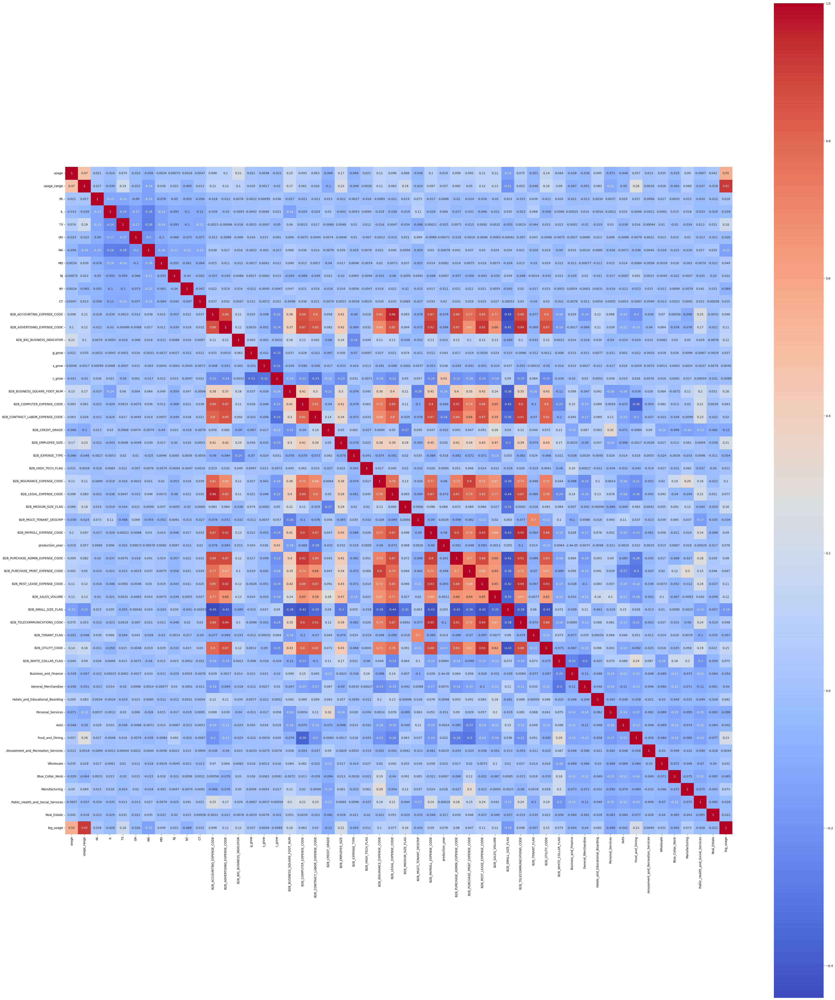

In [10]:
# Heat map showing correlation among attributes
fig=plt.gcf()
fig.set_size_inches(50,60)
sns.heatmap(df.iloc[:,1:].corr(),cmap='coolwarm',annot=True,cbar=True,square=True)
plt.show()

---
# Unsupervised Learning
## Multiple Correspondence Analysis (MCA) <a class="anchor" id="MCA"></a>

In [11]:
!pip install prince
import prince
from prince import MCA

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 414.6/414.6 kB 13.1 MB/s eta 0:00:00


In [12]:
X = df.iloc[:,12:-13]
X=X.loc[:, ~X.columns.isin(['c_grow', 'g_grow', 's_grow'])]
X

,B2B_ACCOUNTING_EXPENSE_CODE,B2B_ADVERTISING_EXPENSE_CODE,B2B_BIG_BUSINESS_INDICATOR,B2B_BUSINESS_SQUARE_FOOT_NUM,B2B_COMPUTER_EXPENSE_CODE,B2B_CONTRACT_LABOR_EXPENSE_CODE,B2B_CREDIT_GRADE,B2B_EMPLOYEE_SIZE,B2B_EXPENSE_TYPE,B2B_HIGH_TECH_FLAG,...,production_year,B2B_PURCHASE_ADMIN_EXPENSE_CODE,B2B_PURCHASE_PRINT_EXPENSE_CODE,B2B_REST_LEASE_EXPENSE_CODE,B2B_SALES_VOLUME,B2B_SMALL_SIZE_FLAG,B2B_TELECOMMUNICATIONS_CODE,B2B_TENANT_FLAG,B2B_UTILITY_CODE,B2B_WHITE_COLLAR_FLAG
0,3.0,2.0,0.0,0.0,5.0,7.0,2.0,1.0,1.0,0.0,...,1.0,3.0,3.0,2.0,2.0,1.0,3.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,8.0,0.0,1.0,0.0,...,9.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,1.0,0.0,...,9.0,0.0,0.0,0.0,0.0,1.0,0.0,3.0,0.0,1.0
3,0.0,0.0,0.0,0.0,1.0,0.0,8.0,0.0,1.0,0.0,...,9.0,1.0,0.0,2.0,0.0,1.0,0.0,2.0,0.0,1.0
4,0.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,1.0,0.0,...,9.0,1.0,4.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29386,4.0,2.0,0.0,1.0,4.0,1.0,0.0,0.0,1.0,0.0,...,1.0,2.0,3.0,3.0,5.0,0.0,2.0,0.0,4.0,1.0
29387,1.0,0.0,0.0,1.0,2.0,1.0,5.0,0.0,1.0,0.0,...,9.0,1.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0
29388,2.0,0.0,0.0,0.0,3.0,2.0,3.0,0.0,1.0,0.0,...,9.0,3.0,3.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
29389,1.0,0.0,0.0,0.0,2.0,1.0,3.0,1.0,1.0,0.0,...,9.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0


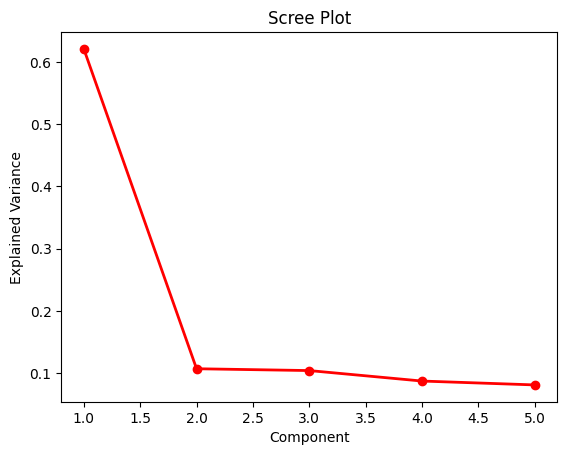

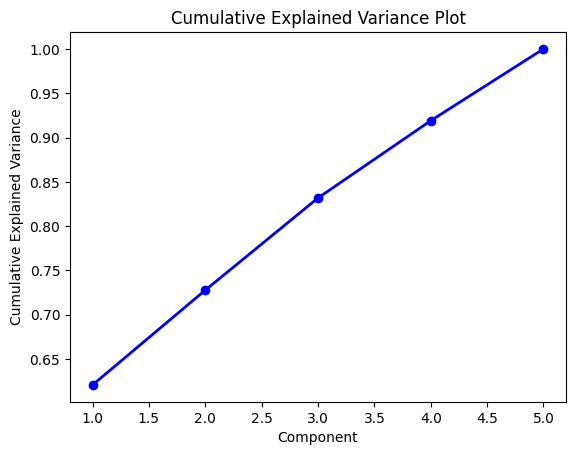

In [13]:
# create an instance of MCA and fit it to your data
mca = MCA(n_components=5)
mca.fit(X)

# compute the eigenvalues and the explained variance
eigenvalues = mca.eigenvalues_
explained_variance = eigenvalues / np.sum(eigenvalues)

# compute the cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance)

# plot the scree plot
fig, ax = plt.subplots()
ax.plot(range(1, len(explained_variance) + 1), explained_variance, 'ro-', linewidth=2)
ax.set_title('Scree Plot')
ax.set_xlabel('Component')
ax.set_ylabel('Explained Variance')
plt.show()

# plot the cumulative explained variance plot
fig, ax = plt.subplots()
ax.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, 'bo-', linewidth=2)
ax.set_title('Cumulative Explained Variance Plot')
ax.set_xlabel('Component')
ax.set_ylabel('Cumulative Explained Variance')
plt.show()

Even though the Scree Plot shows that we only need 2 components, we decided to use 5 to advoid underfit our data

In [14]:
mca = prince.MCA(n_components=5)
mca = mca.fit(X)

In [15]:
mca.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,0.240,42.98%,42.98%
1,0.041,7.41%,50.39%
2,0.040,7.20%,57.59%
3,0.034,6.04%,63.63%
4,0.031,5.61%,69.24%


In [16]:
mca.row_coordinates(X).head()

,0,1,2,3,4
0,-0.406669,-0.344434,-0.143130,-0.157672,-0.028877
1,1.284128,-0.283702,-0.191736,0.509660,0.409215
2,1.425877,-0.243866,-0.275121,0.239197,0.023631
3,1.095669,-0.409653,-0.190117,0.356234,0.418793
4,0.962036,0.169487,-0.254855,-0.228998,-0.016039


In [17]:
mca.column_coordinates(X)

,0,1,2,3,4
B2B_ACCOUNTING_EXPENSE_CODE,-0.283954,0.016766,-0.046675,-0.005869,-0.042221
B2B_ADVERTISING_EXPENSE_CODE,-0.395209,-0.214758,0.080891,0.009156,-0.083638
B2B_BIG_BUSINESS_INDICATOR,-0.774240,0.594210,0.834237,1.123952,-0.320638
B2B_BUSINESS_SQUARE_FOOT_NUM,-0.128568,0.190352,0.616535,0.095767,0.362503
B2B_COMPUTER_EXPENSE_CODE,-0.162581,-0.027827,0.065431,-0.104218,0.004764
B2B_CONTRACT_LABOR_EXPENSE_CODE,-0.335174,-0.335878,-0.036926,-0.161746,-0.020567
B2B_CREDIT_GRADE,0.734974,-0.248096,-0.281372,0.304567,0.218279
B2B_EMPLOYEE_SIZE,-0.272479,0.386347,0.561248,0.589995,-0.184255
B2B_EXPENSE_TYPE,0.569581,-0.008769,0.079557,-0.019958,0.080166
B2B_HIGH_TECH_FLAG,-0.063004,0.288689,-0.033698,-0.408552,0.587875


In [18]:
mca.row_contributions_.head().style.format('{:.000000%}')

,0,1,2,3,4
0,0%,0%,0%,0%,0%
1,0%,0%,0%,0%,0%
2,0%,0%,0%,0%,0%
3,0%,0%,0%,0%,0%
4,0%,0%,0%,0%,0%


In [19]:
mca.column_contributions_.style.format('{:.000000%}')

,0,1,2,3,4
B2B_ACCOUNTING_EXPENSE_CODE,2%,0%,0%,0%,0%
B2B_ADVERTISING_EXPENSE_CODE,3%,5%,1%,0%,1%
B2B_BIG_BUSINESS_INDICATOR,0%,0%,0%,1%,0%
B2B_BUSINESS_SQUARE_FOOT_NUM,0%,2%,18%,1%,8%
B2B_COMPUTER_EXPENSE_CODE,1%,0%,1%,2%,0%
B2B_CONTRACT_LABOR_EXPENSE_CODE,2%,11%,0%,3%,0%
B2B_CREDIT_GRADE,14%,9%,12%,17%,9%
B2B_EMPLOYEE_SIZE,1%,7%,16%,21%,2%
B2B_EXPENSE_TYPE,3%,0%,0%,0%,0%
B2B_HIGH_TECH_FLAG,0%,0%,0%,0%,0%


In [20]:
import altair as alt
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [21]:
mca.plot(
    X,
    x_component=0,
    y_component=1
)

alt.Chart(...)

In [22]:
df_transformed = mca.transform(X)

In [23]:
from sklearn.feature_selection import mutual_info_regression
selected_features = mutual_info_regression(df_transformed, df['usage'])

In [24]:
selected_features

array([0.03777427, 0.03944003, 0.0486748 , 0.0371855 , 0.02580782])

In [25]:
top_features = X.columns[selected_features.argsort()[::-1][:20]]

In [26]:
top_features

Index(['B2B_BIG_BUSINESS_INDICATOR', 'B2B_ADVERTISING_EXPENSE_CODE',
       'B2B_ACCOUNTING_EXPENSE_CODE', 'B2B_BUSINESS_SQUARE_FOOT_NUM',
       'B2B_COMPUTER_EXPENSE_CODE'],
      dtype='object')

---
# Supervised Learning
## Ordinal Logistic Regression <a class="anchor" id="OrdinalLogisticRegression"></a>

In [27]:
mod_prob = OrderedModel(y_usage_range,
                        df[["B2B_BUSINESS_SQUARE_FOOT_NUM","B2B_BIG_BUSINESS_INDICATOR","B2B_MEDIUM_SIZE_FLAG",
                           "B2B_EMPLOYEE_SIZE","B2B_SMALL_SIZE_FLAG"]],
                        distr='logit')
res_log = mod_prob.fit(method='bfgs')
res_log.summary()

Optimization terminated successfully.
         Current function value: 1.529472
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36


<class 'statsmodels.iolib.summary.Summary'>
"""
                             OrderedModel Results                             
==============================================================================
Dep. Variable:            usage_range   Log-Likelihood:                -44953.
Model:                   OrderedModel   AIC:                         8.992e+04
Method:            Maximum Likelihood   BIC:                         9.000e+04
Date:                Thu, 11 May 2023                                         
Time:                        06:55:42                                         
No. Observations:               29391                                         
Df Residuals:                   29382                                         
Df Model:                           9                                         
================================================================================================
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
B2B_BUSINESS_SQUARE_FOOT_NUM     0.0787      0.010      8.016      0.000       0.059       0.098
B2B_BIG_BUSINESS_INDICATOR       1.2769      0.119     10.702      0.000       1.043       1.511
B2B_MEDIUM_SIZE_FLAG             0.5293      0.036     14.758      0.000       0.459       0.600
B2B_EMPLOYEE_SIZE                0.1578      0.007     21.854      0.000       0.144       0.172
B2B_SMALL_SIZE_FLAG             -0.3886      0.024    -16.331      0.000      -0.435      -0.342
1/2                             -1.0134      0.022    -45.528      0.000      -1.057      -0.970
2/3                              0.1653      0.010     15.853      0.000       0.145       0.186
3/4                             -0.1222      0.012     -9.955      0.000      -0.146      -0.098
4/5                              0.2173      0.013     16.592      0.000       0.192       0.243
================================================================================================
"""

In [28]:
predicted = res_log.model.predict(res_log.params, exog=df[['B2B_BUSINESS_SQUARE_FOOT_NUM', 'B2B_BIG_BUSINESS_INDICATOR', 'B2B_MEDIUM_SIZE_FLAG','B2B_EMPLOYEE_SIZE', 'B2B_SMALL_SIZE_FLAG']])
predicted

/opt/conda/lib/python3.10/site-packages/statsmodels/miscmodels/ordinal_model.py:419: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  xb = xb[:, None]


array([[0.31376482, 0.28424573, 0.18480024, 0.14305698, 0.07413223],
       [0.25122542, 0.27067852, 0.20373577, 0.1759816 , 0.09837869],
       [0.34869896, 0.28659502, 0.17315073, 0.12755303, 0.06400225],
       ...,
       [0.34869896, 0.28659502, 0.17315073, 0.12755303, 0.06400225],
       [0.31376482, 0.28424573, 0.18480024, 0.14305698, 0.07413223],
       [0.29707158, 0.28188153, 0.19017895, 0.15114928, 0.07971865]])

What if i use result from MCA?

In [29]:
mod_prob = OrderedModel(y_usage_range,
                        df[['B2B_BIG_BUSINESS_INDICATOR', 'B2B_ADVERTISING_EXPENSE_CODE', 
                           'B2B_ACCOUNTING_EXPENSE_CODE', 'B2B_BUSINESS_SQUARE_FOOT_NUM', 'B2B_COMPUTER_EXPENSE_CODE']],
                        distr='logit')
res_log = mod_prob.fit(method='bfgs',disp=False)
res_log.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OrderedModel Results                             
==============================================================================
Dep. Variable:            usage_range   Log-Likelihood:                -45463.
Model:                   OrderedModel   AIC:                         9.094e+04
Method:            Maximum Likelihood   BIC:                         9.102e+04
Date:                Thu, 11 May 2023                                         
Time:                        06:55:48                                         
No. Observations:               29391                                         
Df Residuals:                   29382                                         
Df Model:                           9                                         
================================================================================================
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
B2B_BIG_BUSINESS_INDICATOR       1.6644      0.117     14.274      0.000       1.436       1.893
B2B_ADVERTISING_EXPENSE_CODE     0.1560      0.010     15.813      0.000       0.137       0.175
B2B_ACCOUNTING_EXPENSE_CODE      0.0856      0.009      9.054      0.000       0.067       0.104
B2B_BUSINESS_SQUARE_FOOT_NUM     0.2294      0.010     23.071      0.000       0.210       0.249
B2B_COMPUTER_EXPENSE_CODE       -0.2351      0.011    -21.658      0.000      -0.256      -0.214
1/2                             -1.0406      0.021    -50.056      0.000      -1.081      -1.000
2/3                              0.1458      0.010     13.969      0.000       0.125       0.166
3/4                             -0.1487      0.012    -12.130      0.000      -0.173      -0.125
4/5                              0.1929      0.013     14.688      0.000       0.167       0.219
================================================================================================
"""

In [30]:
predicted = res_log.model.predict(res_log.params, exog=df[['B2B_BIG_BUSINESS_INDICATOR', 'B2B_ADVERTISING_EXPENSE_CODE', 
                                                           'B2B_ACCOUNTING_EXPENSE_CODE', 'B2B_BUSINESS_SQUARE_FOOT_NUM', 
                                                           'B2B_COMPUTER_EXPENSE_CODE']])
predicted

/opt/conda/lib/python3.10/site-packages/statsmodels/miscmodels/ordinal_model.py:419: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  xb = xb[:, None]


array([[0.39316473, 0.28008649, 0.15662567, 0.1126623 , 0.05746082],
       [0.2192724 , 0.25251861, 0.20714189, 0.19777218, 0.12329493],
       [0.26104192, 0.26802412, 0.19768953, 0.17267764, 0.10056679],
       ...,
       [0.37601057, 0.28109891, 0.16228753, 0.11908805, 0.06151495],
       [0.34164052, 0.28104522, 0.17352729, 0.13305574, 0.07073123],
       [0.34145532, 0.28103692, 0.17358714, 0.13313524, 0.07078537]])

---
## Decision Trees <a class="anchor" id="DecisionTrees"></a>

In [31]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor

**Using result from MCA**

In [32]:
X = df[['B2B_ADVERTISING_EXPENSE_CODE','B2B_ACCOUNTING_EXPENSE_CODE', 'B2B_BUSINESS_SQUARE_FOOT_NUM','B2B_COMPUTER_EXPENSE_CODE']]
X_train, X_test, y_usage_train, y_usage_test = train_test_split(X, y_usage, test_size=0.30)

In [33]:
dtree = DecisionTreeRegressor()
dtree.fit(X_train,y_usage_train)

DecisionTreeRegressor()

In [34]:
dtree.score(X_train,y_usage_train)

0.14942768012344998

In [35]:
dtree.score(X_test,y_usage_test)

0.09339109946986723

evaluate the decision tree

In [36]:
y_pred= dtree.predict(X_test)

In [37]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
# Calculate evaluation metrics using predicted values and actual values
mse = mean_squared_error(y_usage_test, y_pred)
mae = mean_absolute_error(y_usage_test, y_pred)
r2 = r2_score(y_usage_test, y_pred)

# Display the evaluation metrics
print("Mean squared error: {:.2f}".format(mse))
print("Mean absolute error: {:.2f}".format(mae))
print("R-squared: {:.2f}".format(r2))

Mean squared error: 0.35
Mean absolute error: 0.45
R-squared: 0.09


Visualize the evaluation of the model

In [38]:
dtree.feature_importances_
pd.Series(dtree.feature_importances_,index=X_train.columns).sort_values(ascending=False)

B2B_ADVERTISING_EXPENSE_CODE    0.334451
B2B_BUSINESS_SQUARE_FOOT_NUM    0.266595
B2B_COMPUTER_EXPENSE_CODE       0.223087
B2B_ACCOUNTING_EXPENSE_CODE     0.175867
dtype: float64

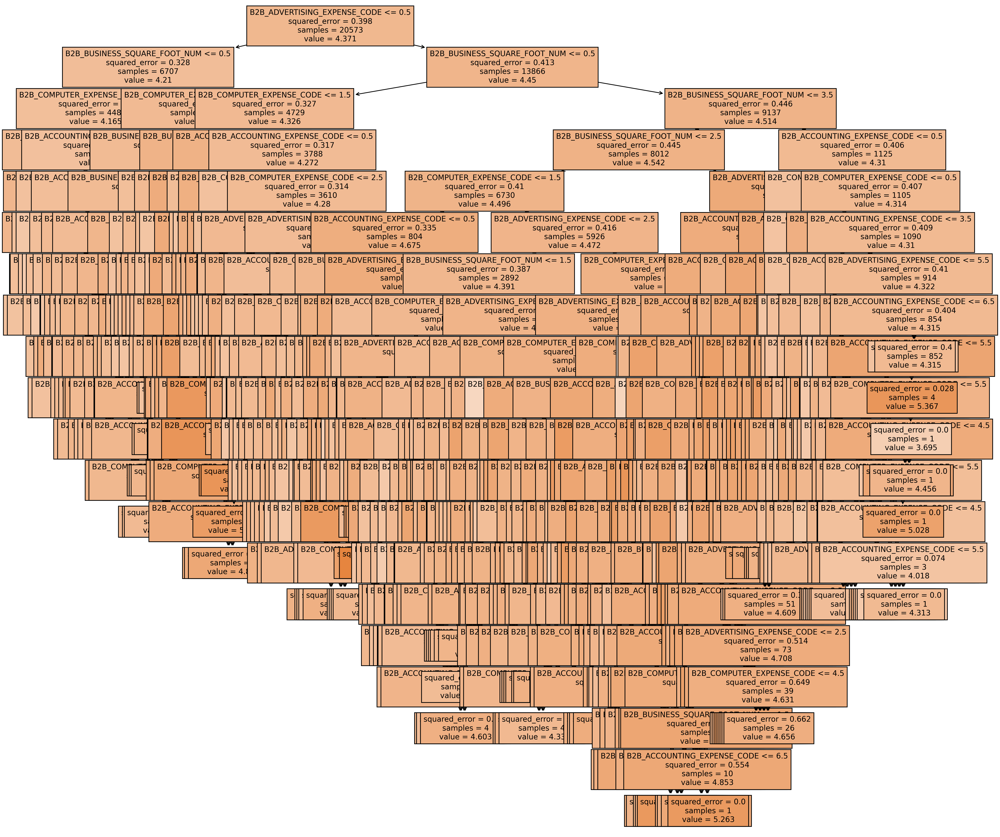

In [39]:
from sklearn import tree
plt.rcParams['figure.figsize'] = [50, 50]

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (20,20), dpi=300)
tree.plot_tree(dtree,fontsize=10, feature_names = X_train.columns,filled = True)
plt.show()

### Hyperparameter tuning

In [40]:
# Hyper parameters range intialization for tuning 

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90] }

In [41]:
# calculating different regression metrics
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
tuning_model = RandomizedSearchCV(dtree,param_distributions=parameters,scoring='neg_mean_squared_error',cv=3,verbose=3,n_iter = 10000)
#tuning_model=GridSearchCV(dtree,param_grid=parameters,scoring='neg_mean_squared_error',cv=3,verbose=3)

# function for calculating how much time take for hyperparameter tuning

def timer(start_time=None):
    if not start_time:
        start_time=datetime.now()
        return start_time
    elif start_time:
        thour,temp_sec=divmod((datetime.now()-start_time).total_seconds(),3600)
        tmin,tsec=divmod(temp_sec,60)
        print(thour,":",tmin,':',round(tsec,2))

In [42]:
%%capture  

from datetime import datetime

start_time=timer(None)

#tuning_model.fit(X_train,y_usage_train)

timer(start_time)

In [43]:
# best hyperparameters 
#tuning_model.best_params_

In [44]:
# best model score
#tuning_model.best_score_

In [45]:
dtree_tuned= DecisionTreeRegressor(splitter='best',
                                   min_weight_fraction_leaf=0.1,
                                   min_samples_leaf=1,
                                   max_leaf_nodes=20,
                                   max_features='sqrt',
                                   max_depth=9)

In [46]:
# fitting model
dtree_tuned.fit(X_train,y_usage_train)

DecisionTreeRegressor(max_depth=9, max_features='sqrt', max_leaf_nodes=20,
                      min_weight_fraction_leaf=0.1)

In [47]:
# prediction 
y_tuned_pred=dtree_tuned.predict(X_test)

In [48]:
# Calculate evaluation metrics using predicted values and actual values
mse = mean_squared_error(y_usage_test, y_tuned_pred)
mae = mean_absolute_error(y_usage_test, y_tuned_pred)
r2 = r2_score(y_usage_test, y_tuned_pred)


# Display the evaluation metrics
print("Mean squared error: {:.2f}".format(mse))
print("Mean absolute error: {:.2f}".format(mae))
print("R-squared: {:.2f}".format(r2))

Mean squared error: 0.37
Mean absolute error: 0.47
R-squared: 0.06


In [49]:
dtree_tuned.feature_importances_
feat_importances= pd.Series(dtree_tuned.feature_importances_,index=X_train.columns).sort_values(ascending=False)
feat_importances

B2B_ADVERTISING_EXPENSE_CODE    0.835174
B2B_COMPUTER_EXPENSE_CODE       0.117514
B2B_BUSINESS_SQUARE_FOOT_NUM    0.047312
B2B_ACCOUNTING_EXPENSE_CODE     0.000000
dtype: float64

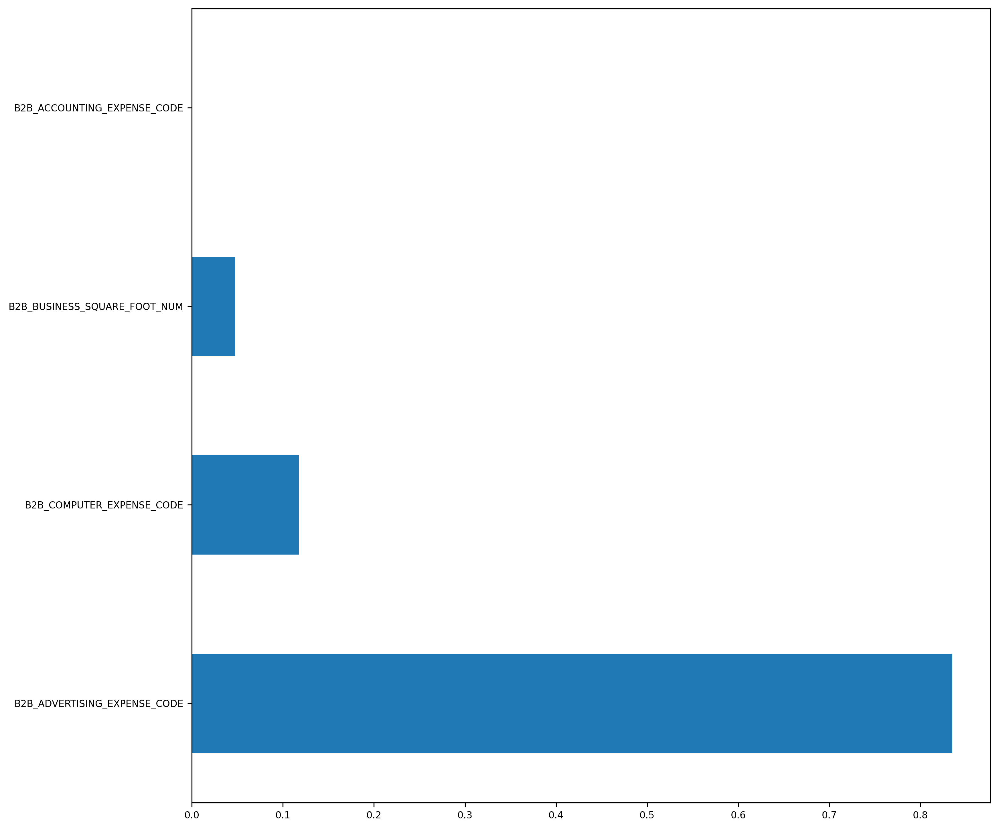

In [50]:
fig, axes = plt.subplots(dpi=300)
feat_importances.nlargest(5).plot(kind='barh', figsize= (12,12), fontsize=8,)
fig.savefig('DecisionTree_Importance Feature.png',bbox_inches = 'tight')
plt.show()

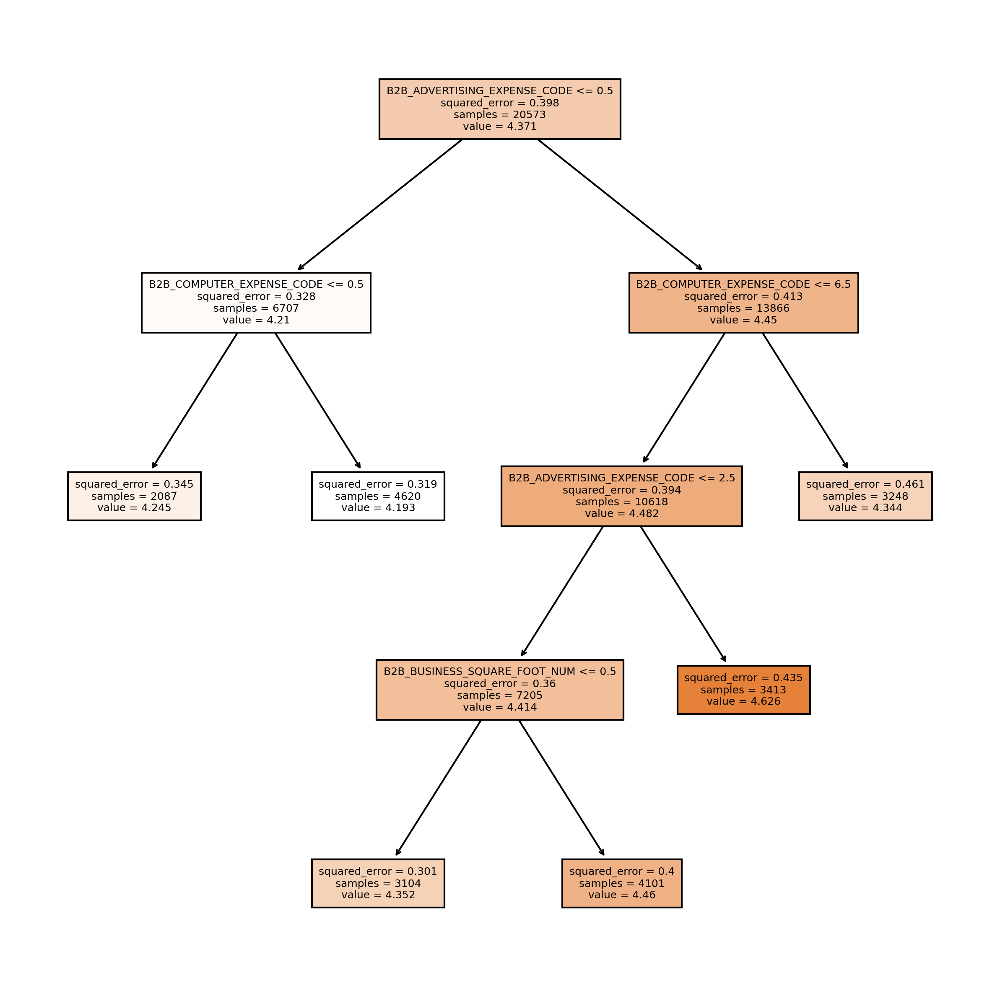

In [51]:
from sklearn import tree

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10,10), dpi=300)
tree.plot_tree(dtree_tuned,fontsize=6, feature_names = X_train.columns,filled = True)
fig.savefig('DecisionTree.png',bbox_inches='tight')
plt.show()

below 4 -> range 1
4 to 4.39794 -> range 2
4.39797 to 4.69896 -> range 3
4.69906 to 5.09684 -> range 4
above 5.09684 -> range 5

---
## Random Forests <a class="anchor" id="RandomForests"></a>

In [52]:
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor()

rfr.fit(X_train, y_usage_train)

RandomForestRegressor()

In [53]:
y_pred = rfr.predict(X_test)

In [54]:
rfr.score(X_train,y_usage_train)

0.14756425559887332

In [55]:
rfr.score(X_test,y_usage_test)

0.10251150235419859

In [56]:
# Calculate evaluation metrics using predicted values and actual values
mse = mean_squared_error(y_usage_test, y_pred)
mae = mean_absolute_error(y_usage_test, y_pred)
r2 = r2_score(y_usage_test, y_pred)

# Display the evaluation metrics
print("Mean squared error: {:.2f}".format(mse))
print("Mean absolute error: {:.2f}".format(mae))
print("R-squared: {:.2f}".format(r2))

Mean squared error: 0.35
Mean absolute error: 0.45
R-squared: 0.10


In [57]:
rfr.feature_importances_
feat_importances= pd.Series(rfr.feature_importances_,index=X_train.columns).sort_values(ascending=False)
feat_importances

B2B_BUSINESS_SQUARE_FOOT_NUM    0.281157
B2B_ADVERTISING_EXPENSE_CODE    0.270318
B2B_COMPUTER_EXPENSE_CODE       0.238363
B2B_ACCOUNTING_EXPENSE_CODE     0.210162
dtype: float64

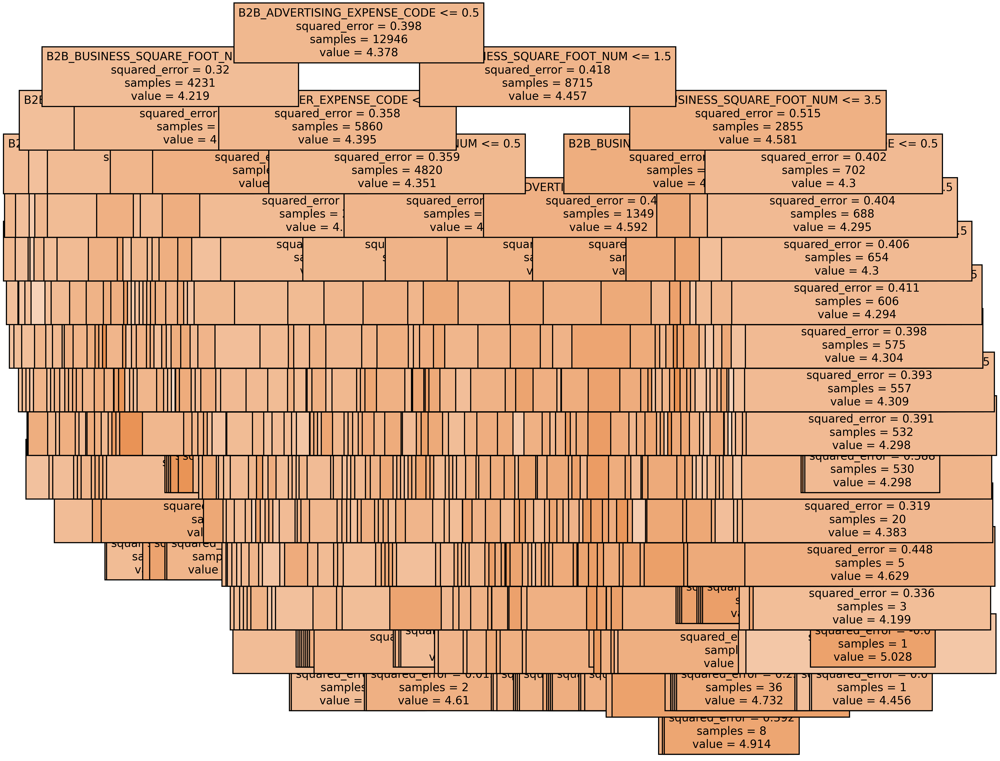

In [58]:
plt.rcParams['figure.figsize'] = [50, 50]
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (12,12), dpi=300)
tree.plot_tree(rfr.estimators_[0],fontsize=10, feature_names = X_train.columns,filled = True)
plt.show()

### We tune the parameter again

In [59]:
parameters={"criterion": ["squared_error", "absolute_error", "friedman_mse", "poisson"],
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90] }

In [60]:
tuning_model = RandomizedSearchCV(dtree,param_distributions=parameters,scoring='neg_mean_squared_error',cv=3,verbose=3,n_iter = 10000)

In [61]:
%%capture

start_time=timer(None)

#tuning_model.fit(X_train,y_usage_train)

timer(start_time)

In [62]:
#tuning_model.best_params_

In [63]:
#tuning_model.best_score_

In [64]:
rfr_tuned = RandomForestRegressor(min_weight_fraction_leaf=0.1,
                                  min_samples_leaf=2,
                                  max_leaf_nodes=70,
                                  max_features='log2',
                                  max_depth=12,
                                  criterion='friedman_mse')
rfr_tuned.fit(X_train,y_usage_train)
# prediction 
y_tuned_pred=rfr_tuned.predict(X_test)

In [65]:
# Calculate evaluation metrics using predicted values and actual values
mse = mean_squared_error(y_usage_test, y_tuned_pred)
mae = mean_absolute_error(y_usage_test, y_tuned_pred)
r2 = r2_score(y_usage_test, y_tuned_pred)

# Display the evaluation metrics
print("Mean squared error: {:.2f}".format(mse))
print("Mean absolute error: {:.2f}".format(mae))
print("R-squared: {:.2f}".format(r2))

Mean squared error: 0.36
Mean absolute error: 0.46
R-squared: 0.07


In [66]:
rfr_tuned.feature_importances_
feat_importances= pd.Series(rfr_tuned.feature_importances_,index=X_train.columns).sort_values(ascending=False)
feat_importances

B2B_ADVERTISING_EXPENSE_CODE    0.446842
B2B_BUSINESS_SQUARE_FOOT_NUM    0.393296
B2B_ACCOUNTING_EXPENSE_CODE     0.100036
B2B_COMPUTER_EXPENSE_CODE       0.059827
dtype: float64

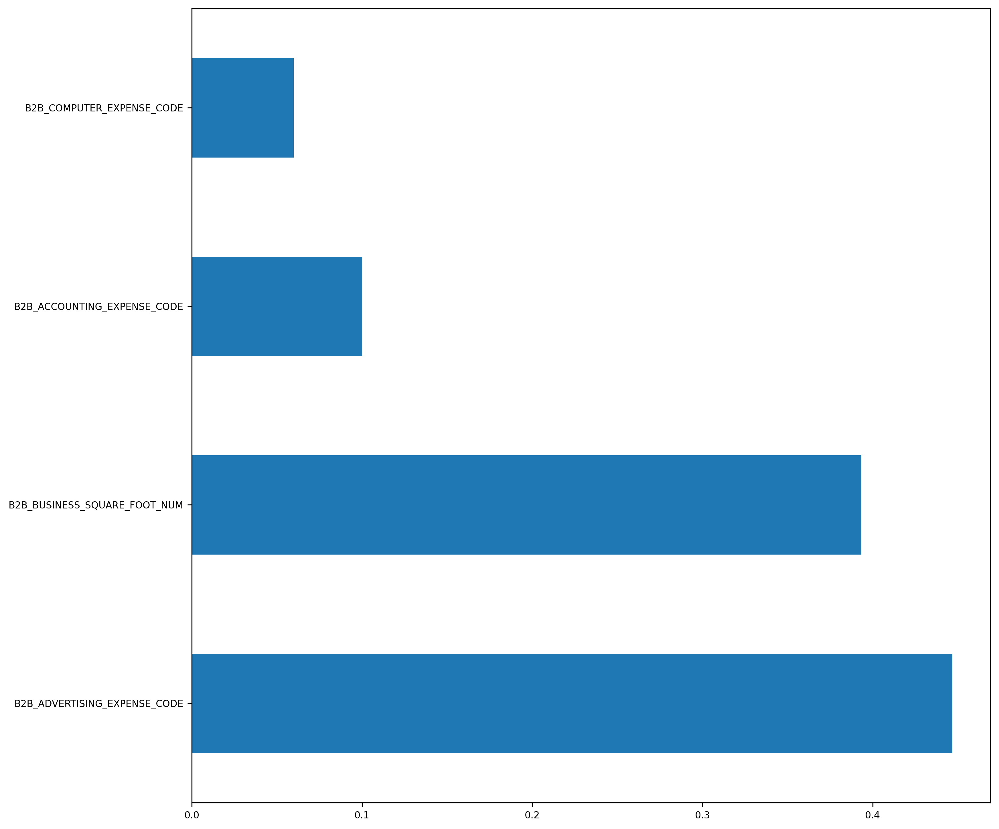

In [67]:
fig, axes = plt.subplots(dpi=300)
feat_importances.nlargest(5).plot(kind='barh', figsize= (12,12), fontsize=8,)
fig.savefig('RFR_Importance Feature.png',bbox_inches = 'tight')
plt.show()

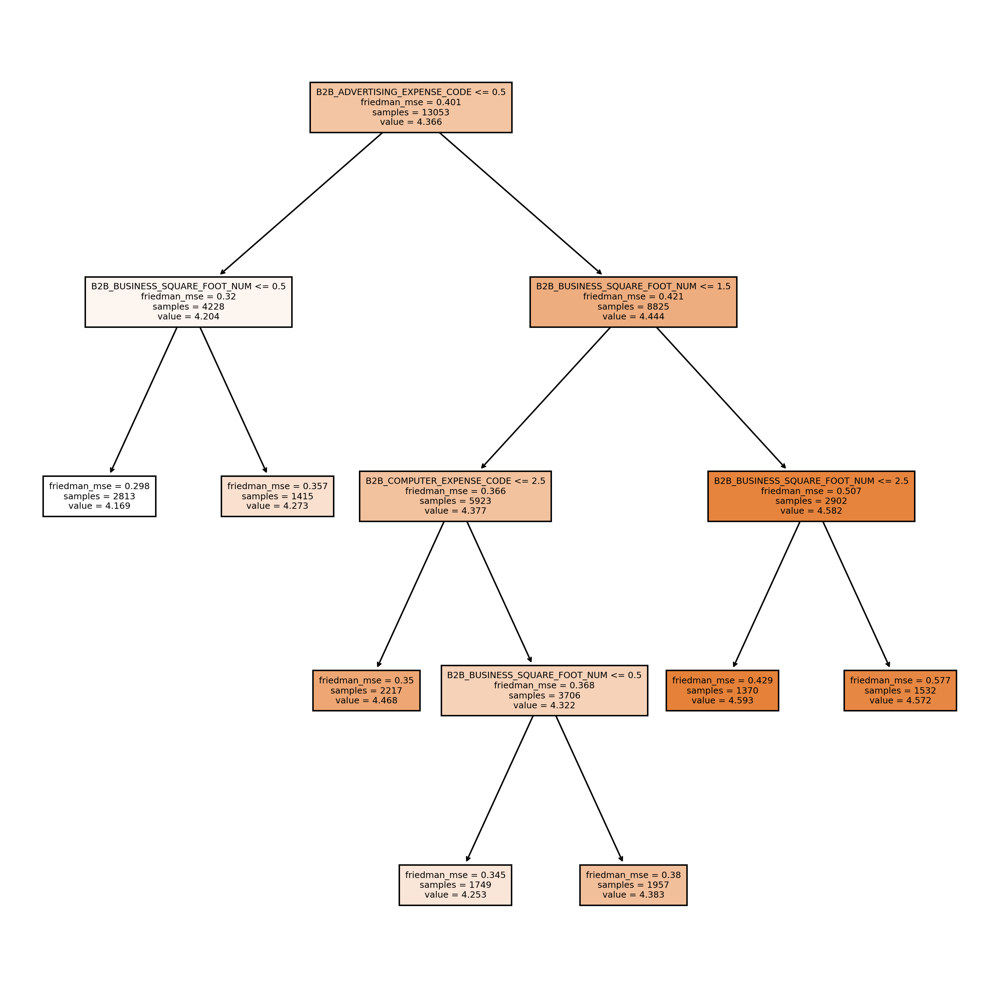

In [68]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (12,12), dpi=300)
tree.plot_tree(rfr_tuned.estimators_[0],fontsize=6, feature_names = X_train.columns,filled = True)
fig.savefig('RandomForest.png',bbox_inches ='tight')
plt.show()

## Naive Bayers Classification <a class="anchor" id="NaiveBayers"></a>

In [69]:
X= df.iloc[:,3:-1]
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29391 entries, 0 to 29390
Data columns (total 49 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   PA                                 29391 non-null  float64
 1   IL                                 29391 non-null  float64
 2   TX                                 29391 non-null  float64
 3   OH                                 29391 non-null  float64
 4   MA                                 29391 non-null  float64
 5   MD                                 29391 non-null  float64
 6   NJ                                 29391 non-null  float64
 7   NY                                 29391 non-null  float64
 8   CT                                 29391 non-null  float64
 9   B2B_ACCOUNTING_EXPENSE_CODE        29391 non-null  float64
 10  B2B_ADVERTISING_EXPENSE_CODE       29391 non-null  float64
 11  B2B_BIG_BUSINESS_INDICATOR         29391 non-null  flo

In [70]:
X_train, X_test, y_usage_range_train, y_usage_range_test = train_test_split(X, y_usage_range, test_size=0.30)

In [71]:
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, y_usage_range_train)
y_pred = gnb.predict(X_test)

y_pred

array([5, 1, 2, ..., 2, 2, 1])

In [72]:
accuracy = accuracy_score(y_usage_range_test, y_pred)

print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_usage_range_test, y_pred)))

Model accuracy score: 0.3474


In [73]:
y_pred_train = gnb.predict(X_train)

y_pred_train

array([5, 2, 3, ..., 2, 5, 2])

In [74]:
print('Training-set accuracy score: {0:0.4f}'. format(accuracy_score(y_usage_range_train, y_pred_train)))

Training-set accuracy score: 0.3573


In [75]:
y_usage_range_test.value_counts()

1    2246
2    2243
3    1719
4    1592
5    1018
Name: usage_range, dtype: int64

In [76]:
cfm = confusion_matrix(y_usage_range_test, y_pred)

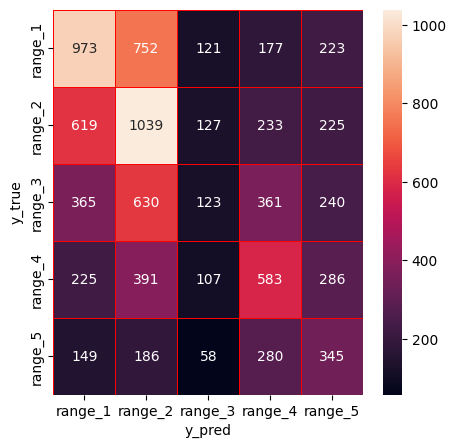

In [77]:
range_name = ['range_1', 'range_2', 'range_3', 'range_4', 'range_5']
f, ax = plt.subplots(figsize = (5,5))
cm = pd.DataFrame(cfm, columns = range_name, index = range_name)
sns.heatmap(cm, annot = True, linewidths = 0.5, linecolor = 'red', fmt = ".0f", ax = ax)
plt.xlabel("y_pred")
plt.ylabel("y_true")
plt.show()

In [78]:
from sklearn.metrics import classification_report

print(classification_report(y_usage_range_test, y_pred))

              precision    recall  f1-score   support

           1       0.42      0.43      0.43      2246
           2       0.35      0.46      0.40      2243
           3       0.23      0.07      0.11      1719
           4       0.36      0.37      0.36      1592
           5       0.26      0.34      0.30      1018

    accuracy                           0.35      8818
   macro avg       0.32      0.33      0.32      8818
weighted avg       0.33      0.35      0.33      8818



In [79]:
y_pred_prob = gnb.predict_proba(X_test)[0:10]

y_pred_prob

array([[6.40151854e-06, 3.87261827e-07, 1.40713244e-03, 1.42399045e-03,
        9.97162088e-01],
       [8.40812788e-01, 8.82031180e-02, 5.56821668e-02, 8.74083152e-03,
        6.56109573e-03],
       [1.92085244e-02, 8.24793459e-01, 1.11715068e-01, 4.42706626e-02,
        1.22860216e-05],
       [3.82194136e-01, 6.02992552e-01, 9.13190379e-03, 5.66430895e-03,
        1.70987960e-05],
       [2.51006387e-02, 9.18536367e-01, 2.72263318e-02, 2.91361222e-02,
        5.39797615e-07],
       [1.64587819e-01, 8.24889380e-01, 9.62397794e-03, 8.98711348e-04,
        1.11222560e-07],
       [1.21543285e-03, 1.04394049e-02, 1.24731509e-01, 2.08724851e-01,
        6.54888802e-01],
       [1.12745228e-43, 4.94529581e-80, 3.39507687e-25, 1.39288799e-22,
        1.00000000e+00],
       [6.45284665e-01, 3.51034501e-01, 2.17465851e-03, 1.50617366e-03,
        1.80003842e-09],
       [3.69427258e-03, 1.50563532e-01, 3.30815042e-01, 2.13659635e-01,
        3.01267519e-01]])

In [80]:
y_pred_prob_df = pd.DataFrame(data=y_pred_prob, columns=['Prob of range 1', 'Prob of range 2',  'Prob of range 3','Prob of range 4', 'Prob of range 5'])

y_pred_prob_df

,Prob of range 1,Prob of range 2,Prob of range 3,Prob of range 4,Prob of range 5
0,6.401519e-06,3.872618e-07,1.407132e-03,1.423990e-03,9.971621e-01
1,8.408128e-01,8.820312e-02,5.568217e-02,8.740832e-03,6.561096e-03
2,1.920852e-02,8.247935e-01,1.117151e-01,4.427066e-02,1.228602e-05
3,3.821941e-01,6.029926e-01,9.131904e-03,5.664309e-03,1.709880e-05
4,2.510064e-02,9.185364e-01,2.722633e-02,2.913612e-02,5.397976e-07
5,1.645878e-01,8.248894e-01,9.623978e-03,8.987113e-04,1.112226e-07
6,1.215433e-03,1.043940e-02,1.247315e-01,2.087249e-01,6.548888e-01
7,1.127452e-43,4.945296e-80,3.395077e-25,1.392888e-22,1.000000e+00
8,6.452847e-01,3.510345e-01,2.174659e-03,1.506174e-03,1.800038e-09
9,3.694273e-03,1.505635e-01,3.308150e-01,2.136596e-01,3.012675e-01


---
## K-Nearest Neighbor (K-NN) <a class="anchor" id="KNN"></a>

In [81]:
# Setting independent variables
X = df.iloc[:,3:-1]
X

,PA,IL,TX,OH,MA,MD,NJ,NY,CT,B2B_ACCOUNTING_EXPENSE_CODE,...,Hotels_and_Educational_Boarding,Personal_Services,Auto,Food_and_Dining,Amusement_and_Recreation_Services,Wholesale,Blue_Collar_Work,Manufacturing,Public_Health_and_Social_Services,Real_Estate
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29386,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
29387,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
29388,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29389,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [82]:
y_usage_range

0        1
1        1
2        4
3        2
4        2
        ..
29386    4
29387    2
29388    2
29389    4
29390    1
Name: usage_range, Length: 29391, dtype: int64

In [83]:
X_train_knn, X_test_knn, y_train_knn, y_test_knn = train_test_split(X, y_usage_range, test_size=0.3)

In [84]:
knn = KNeighborsClassifier(leaf_size = 5, n_neighbors=40, metric= 'manhattan')

# Train the model
knn.fit(X_train_knn, y_train_knn)

# Make predictions
y_pred_knn = knn.predict(X_test_knn)

# Evaluate the model
accuracy_knn = accuracy_score(y_test_knn, y_pred_knn)
print("Accuracy:", accuracy_knn)

Accuracy: 0.3864821955091858


In [85]:
print(classification_report(y_test_knn, y_pred_knn))

              precision    recall  f1-score   support

           1       0.42      0.56      0.48      2239
           2       0.37      0.40      0.38      2312
           3       0.28      0.18      0.22      1685
           4       0.40      0.38      0.39      1582
           5       0.46      0.33      0.39      1000

    accuracy                           0.39      8818
   macro avg       0.38      0.37      0.37      8818
weighted avg       0.38      0.39      0.38      8818



In [86]:
cfm = confusion_matrix(y_usage_range_test, y_pred)

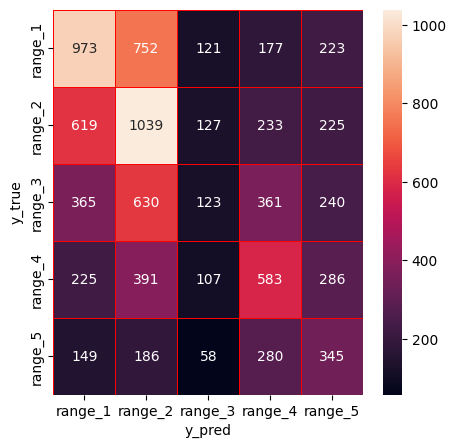

In [87]:
range_name = ['range_1', 'range_2', 'range_3', 'range_4', 'range_5']
f, ax = plt.subplots(figsize = (5,5))
cm = pd.DataFrame(cfm, columns = range_name, index = range_name)
sns.heatmap(cm, annot = True, linewidths = 0.5, linecolor = 'red', fmt = ".0f", ax = ax)
plt.xlabel("y_pred")
plt.ylabel("y_true")
plt.show()